In [19]:
import django
import sys, os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta
import numpy as np

sys.path.append('/home/galm/software/django/tmv/BasicBrowser/')
os.environ.setdefault("DJANGO_SETTINGS_MODULE", "BasicBrowser.settings")
django.setup()

from twitter.models import *
import parliament.models as pms

from django.db.models import Sum, Count
from django.db.models.fields import DateField
from django.db.models.functions import Cast
import textwrap as tw
import datetime

import igraph
import mpld3

from adjustText import adjust_text

print(igraph.__version__)

0.7.1


In [2]:
def draw_network(ax, g, layout, labels, interactive=False):
    #label_ids = [l['id'] for l in labels]
    x = [x[0] for x in layout]
    y = [x[1] for x in layout]
    c = [v["color"] for v in g.vs if v["color"] is not None]
    
    s = [12 + v["tweets"]*0.15 for v in g.vs]
    lw = [0.1 for v in g.vs ]

    scatter = ax.scatter(x,y,c=c,s=s,edgecolor="black",linewidths=lw)
    

    for e in g.es:#[:1000]:
        s = layout[e.source]
        t = layout[e.target]
        ex = [s[0],t[0]]
        ey = [s[1],t[1]]
        lw = 0.05+(np.log(e['weight']+1)*0.5) #+0.05+(np.log(e['connection_to_n']+1)*5)  #+0.05+np.log(e['connection_to_n'])
        alpha = 0.25
        ax.plot(
            ex,
            ey,
            c="grey",
            lw=lw,
            alpha=alpha,
            zorder=-5
        )    

    texts = []
    for l in labels:
        xy = layout[l["id"]]
        texts.append(ax.text(xy[0],xy[1],l["name"],fontsize=8))

    adjust_text(texts, arrowprops=dict(arrowstyle="->", color='r', lw=0.5))
    for text in texts:
        text.set_alpha(0.7)
        
    ax.grid(False)
    ax.axis('off')
    
    if interactive:
        tooltip =  mpld3.plugins.PointLabelTooltip(
            scatter, 
            labels=[x for x in g.vs["twitter-name"] if x is not None]
        )
        return tooltip

In [3]:
min_tweets = 10

tweets = Status.objects.filter(text__icontains="kohle")

user_counts = tweets.values('author').annotate(
    n = Count('pk')
)

user_counts.filter(n__gt=min_tweets).count()

3531

In [4]:
user_rts = tweets.filter(retweeted_by__isnull=False).values('author','retweeted_by').annotate(
    n = Count('pk')
)
print(user_rts.count())
user_rts.order_by('-n')

7471


<QuerySet [{'author': 14717887, 'retweeted_by': 1010195160033058816, 'n': 29}, {'author': 14717887, 'retweeted_by': 705447186822242304, 'n': 25}, {'author': 999700346548183040, 'retweeted_by': 4158191963, 'n': 18}, {'author': 14717887, 'retweeted_by': 222041764, 'n': 15}, {'author': 14717887, 'retweeted_by': 1475734592, 'n': 15}, {'author': 14717887, 'retweeted_by': 3197709759, 'n': 15}, {'author': 3197709759, 'retweeted_by': 96225145, 'n': 15}, {'author': 48406195, 'retweeted_by': 991688353916612609, 'n': 14}, {'author': 999700346548183040, 'retweeted_by': 1033419050205044736, 'n': 14}, {'author': 14717887, 'retweeted_by': 112526774, 'n': 13}, {'author': 14717887, 'retweeted_by': 96225145, 'n': 12}, {'author': 14717887, 'retweeted_by': 95407913, 'n': 11}, {'author': 14717887, 'retweeted_by': 1043273344907399169, 'n': 11}, {'author': 999700346548183040, 'retweeted_by': 24351469, 'n': 10}, {'author': 14717887, 'retweeted_by': 85090936, 'n': 10}, {'author': 18933321, 'retweeted_by': 1362

In [5]:
from collections import ChainMap
tweeters = set(user_rts.values_list('author',flat=True))
retweeters = set(user_rts.values_list('retweeted_by',flat=True))
print(len(tweeters))
print(len(retweeters))
user_ids = tweeters | retweeters
id_map = [{uid: i} for i,uid in enumerate(user_ids)]
id_map = dict(ChainMap(*id_map))
g = igraph.Graph()
g.add_vertices(len(user_ids))

862
4408


In [6]:
tuids = list(tweets.filter(retweeted_by__isnull=False).values_list('author__id',flat=True))

In [7]:
colours = [None] * len(user_ids)
tweet_n = [None] * len(user_ids)
names = [None] * len(user_ids)

for uid, i in id_map.items():
    u = User.objects.get(pk=uid)
    names[i] = u.name
    tweet_n[i] = len([t for t in tuids if t==uid])
    if u.person:
        colours[i] = u.person.party.colour
    else:
        colours[i] = "#d3d3d3"
        
g.vs["twitter-name"] = names
g.vs["color"] = colours
g.vs["tweets"] = tweet_n



In [8]:

weights = []
edges = []
for ur in user_rts:
    edges.append((id_map[ur['author']],id_map[ur['retweeted_by']]))
    weights.append(ur['n'])

g.add_edges(edges)
g.es['weight'] = weights


In [9]:
print(g.summary())

IGRAPH U-W- 5027 7471 -- 
+ attr: color (v), tweets (v), twitter-name (v), weight (e)


In [10]:
big_g = g

big_layout = big_g.layout("drl")

visual_style = {}
visual_style["vertex_size"] = [3 + (0.05*t) for t in g.vs["tweets"]]
visual_style["vertex_color"] = g.vs["color"]
visual_style["vertex_label_size"] = 8
visual_style["edge_width"] = [0.1 + (0.2 * w) for w in g.es["weight"]]
visual_style["layout"] = big_layout
visual_style["edge_arrow_width"] = 2
#visual_style["bbox"] = (300, 300)
#visual_style["margin"] = 20
igraph.plot(big_g, **visual_style)

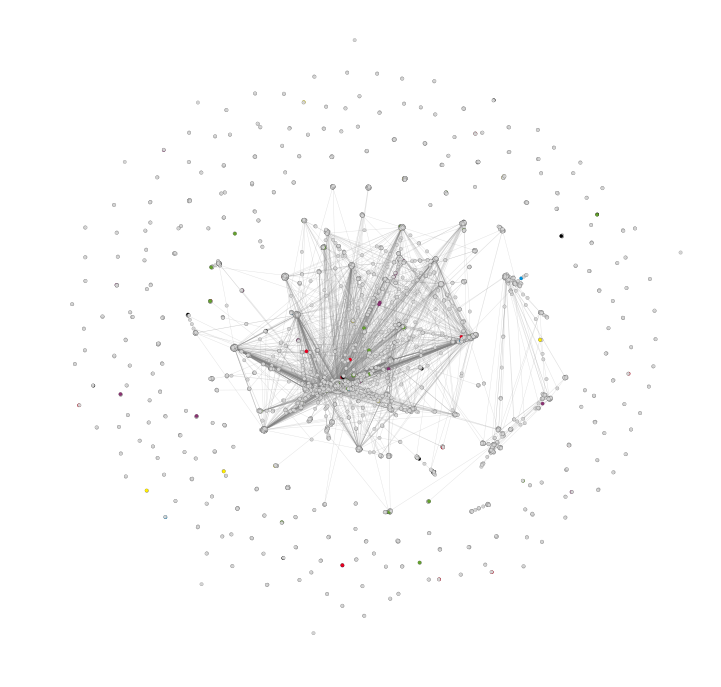

In [11]:


    
fig, ax = plt.subplots(figsize=(12,12))

draw_network(ax, big_g, big_layout, [])

plt.show()

In [20]:
g = g.clusters().giant()

ig_layout = g.layout("fr")


In [21]:
most_retweeted = tweets.filter(retweeted_by__isnull=False).values('author__screen_name').annotate(
    n = Count('retweeted_by')
).order_by('-n')
most_retweeted[:5]

<QuerySet [{'author__screen_name': 'campact', 'n': 1434}, {'author__screen_name': 'DanielHofing', 'n': 391}, {'author__screen_name': 'CoalShut', 'n': 336}, {'author__screen_name': 'CKemfert', 'n': 306}, {'author__screen_name': 'anettselle', 'n': 221}]>

In [29]:
labels = []
for i, d in enumerate(g.degree()):
    if d > 20:
        labels.append({
            "id": i,
            "name": g.vs["twitter-name"][i],
            "d": d 
        })
        print(d)
        print(g.vs["twitter-name"][i])

248
ShutDownCoalNOW
22
Vegan Spiegelei
58
ARD Morgenmagazin
73
CoalExit
22
Lorenz Gösta Beutin
21
Michael Kunz
25
BUND Berlin
33
Grüne im Bundestag 🇪🇺🏳️‍🌈
31
Bushi 🐿️🐿️🐿️
28
Cat in Chief
57
Claudia Sommer
23
DLR_de
45
Argo Nerd
112
Fraktion der AfD im 🇩🇪 Deutschen Bundestag
21
VCI-Redaktion
31
Jürgen Döschner
47
Brick Medak
53
Jennifer Morgan
214
Anett Selle
33
Andrea Schlegel
166
Daniel Mack
147
Jakob Blasel
30
Aufstehen
21
GRÜNE JUGEND
213
ARTE Re:
60
Annalena Baerbock
87
BÜNDNIS90/DIE GRÜNEN
57
Deutschlandfunk
22
Cem Özdemir
866
campact
37
Clean Energy Wire
29
Don Alphonso
47
Kohleausstieg bleibt Handarbeit
40
Ente™ to go
32
Bernd Schade
23
PMS Reckin (Frettchen)
23
@antoniacarla
118
BUNDjugend
25
BEE
21
Armin Laschet
36
Basso Continuo
26
Edwin Kronschnabel
24
Hubert Weiger
238
Claudia Kemfert
216
Daniel Hofinger
34
christoph bals
41
WDR Aktuelle Stunde
23
Laura Wahl
48
Oliver Krischer
30
Aljoscha Kreß 🏴‍☠️🇺🇳 #SaveYourInternet
23
Bernd Riexinger
38
Dr. Alexander Will
42
Attac Deutsc

In [33]:
labels = sorted(labels, key=lambda k: k['d'], reverse=True)
labels

[{'d': 866, 'id': 1339, 'name': 'campact'},
 {'d': 248, 'id': 11, 'name': 'ShutDownCoalNOW'},
 {'d': 238, 'id': 2078, 'name': 'Claudia Kemfert'},
 {'d': 216, 'id': 2187, 'name': 'Daniel Hofinger'},
 {'d': 214, 'id': 819, 'name': 'Anett Selle'},
 {'d': 213, 'id': 1074, 'name': 'ARTE Re:'},
 {'d': 178, 'id': 3596, 'name': 'Cologne SDGs'},
 {'d': 166, 'id': 940, 'name': 'Daniel Mack'},
 {'d': 147, 'id': 965, 'name': 'Jakob Blasel'},
 {'d': 128, 'id': 3760, 'name': 'Climate Analytics'},
 {'d': 118, 'id': 1624, 'name': 'BUNDjugend'},
 {'d': 117, 'id': 4026, 'name': 'Aktion Unterholz'},
 {'d': 112, 'id': 702, 'name': 'Fraktion der AfD im 🇩🇪 Deutschen Bundestag'},
 {'d': 105, 'id': 2921, 'name': 'Initiative Buirer für Buir'},
 {'d': 92, 'id': 3066, 'name': 'Fossil Free Berlin'},
 {'d': 87, 'id': 1119, 'name': 'BÜNDNIS90/DIE GRÜNEN'},
 {'d': 85, 'id': 3577, 'name': 'Lisa Badum'},
 {'d': 74, 'id': 4150, 'name': 'Die Nachrichten'},
 {'d': 73, 'id': 307, 'name': 'CoalExit'},
 {'d': 69, 'id': 3085

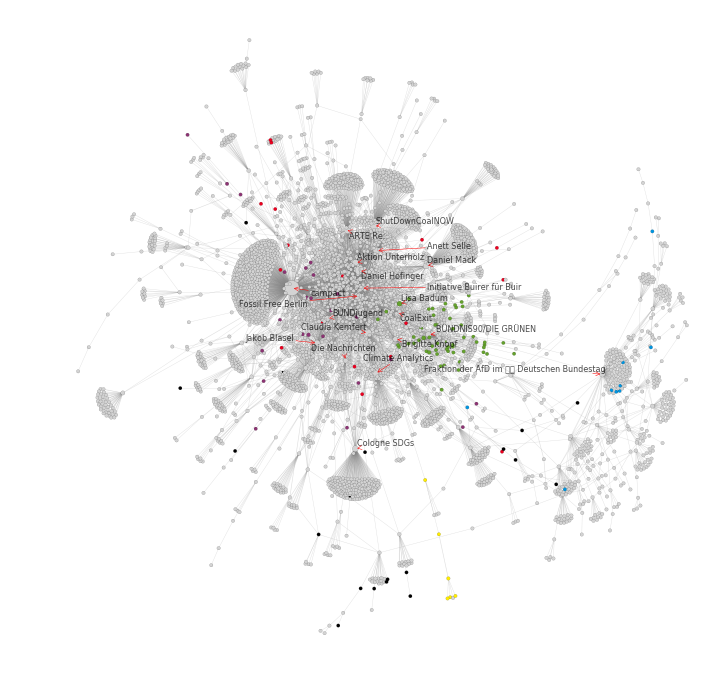

In [34]:
fig, ax = plt.subplots(figsize=(12,12))

draw_network(ax, g, ig_layout, labels[:20])

plt.show()

In [17]:
bs = tweets.filter(author__name="Bernd Schade").first()
print(bs.text)
print(bs.retweeted_by.all().count())

"Ohne Kohle, Gas und auch Atomkraft wäre die Stromversorgung zusammengebrochen."

https://t.co/snVyBk7ncl
32


In [35]:
fig, ax = plt.subplots(figsize=(12,12))

tooltip = draw_network(ax, g, ig_layout, [], interactive=True)

ax.grid(False)
ax.axis('off')

mpld3.plugins.connect(fig, tooltip)

mpld3.display()
